In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz')

In [6]:
dtfa = DTFA.DeepTFA([b for b in lepping_db.all() if 'response' not in b.task and 'tones' not in b.task],
                    mask='/home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz',num_factors=100, embedding_dim=2)

02/03/2020 13:43:10 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run3_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:43:11 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run2_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:43:13 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run4_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sound_depression_mask_MNI152.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:43:14 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run5_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/mask/sou

In [7]:
dtfa.num_parameters()

1278212

In [8]:
dtfa.load_state('data/lepping_noresponse_restz_k100_n1000_01302020_042320')

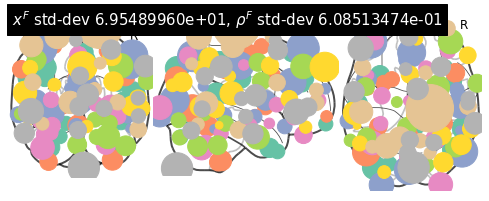

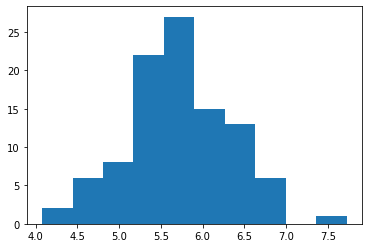

(<nilearn.plotting.displays.OrthoProjector at 0x7f622f4aee90>,
 tensor([[ -21.3254,  -83.4049,  -32.5267],
         [  45.6291,    2.4461,    5.9028],
         [ -55.0895,  -19.9913,   29.1740],
         [   6.1085,  -42.5863,   47.6647],
         [ -14.7461,   69.2207,  -18.7359],
         [  56.3537,  -45.7675,   12.5008],
         [   4.3108,   33.5476,   56.0259],
         [ -37.6187,  -87.2157,   39.7992],
         [ -31.5836,    9.9364,  -43.9246],
         [  42.8147,  -68.3606,  -16.8838],
         [  36.9443,   18.4007,  -47.6765],
         [  40.4719,   44.4106,   23.6814],
         [ -37.1962,   47.4172,   29.0014],
         [  -2.0604,  -55.2511,  -20.8121],
         [  47.6546,   12.3759,   30.6210],
         [  -0.3870,  -87.4713,   29.0541],
         [ -33.2928,  -43.9145,  -59.0125],
         [ -43.7623,   -5.1330,   -9.0797],
         [ -61.9486,  -36.5596,   38.1590],
         [  24.6280,   70.0454,  -10.7971],
         [  33.9193,  -40.6164,  -57.2907],
         [ -4

In [9]:
dtfa.visualize_factor_embedding()

In [10]:
def subject_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [11]:
def task_labeler(task):
    if task == 'negative_music':
        task = 'Negative music'
    elif task == 'positive_music':
        task = 'Positive music'
    elif task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = task.capitalize()
    return task

In [12]:
def lepping_2017_labeler(block):
    task = task_labeler(block.task)
    return task + ' stimulus'

In [13]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

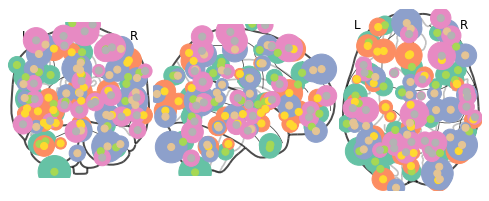

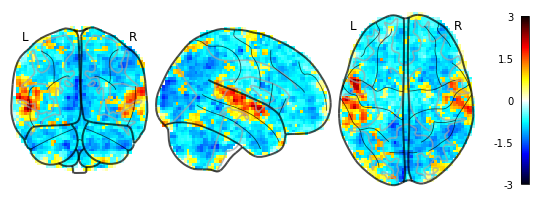

02/03/2020 13:48:10 Reconstruction Error (Frobenius Norm): 8.00857010e+01 out of 7.67137085e+02


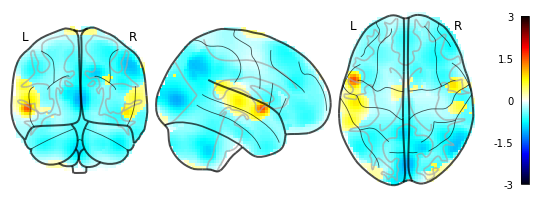

02/03/2020 13:48:12 Reconstruction Error (Frobenius Norm): 8.00857010e+01 out of 7.67137085e+02


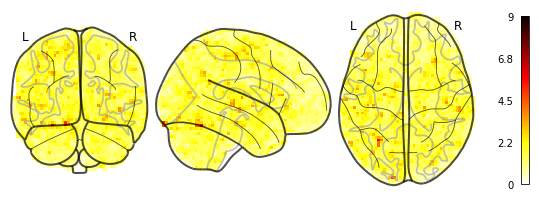

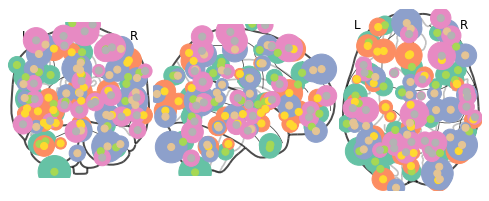

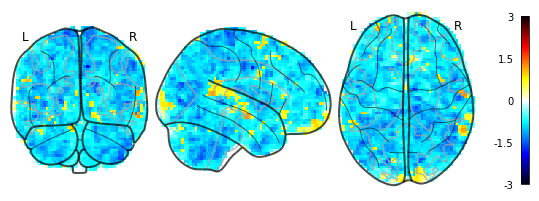

02/03/2020 13:48:16 Reconstruction Error (Frobenius Norm): 7.69422913e+01 out of 9.58201843e+02


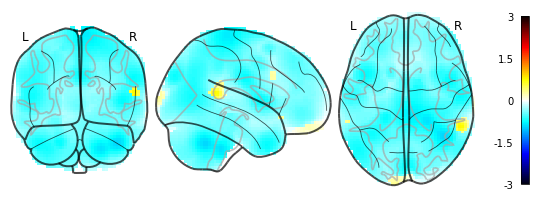

02/03/2020 13:48:18 Reconstruction Error (Frobenius Norm): 7.69422913e+01 out of 9.58201843e+02


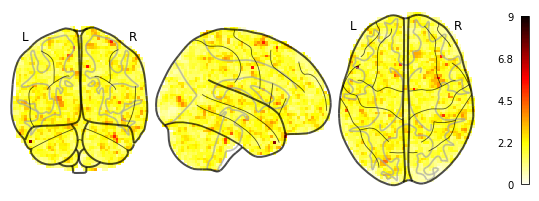

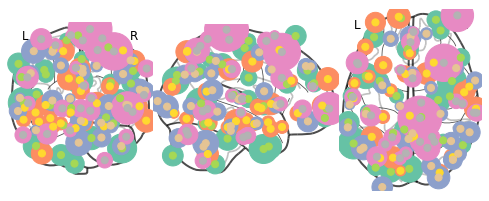

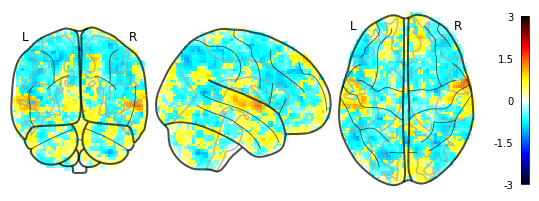

02/03/2020 13:48:22 Reconstruction Error (Frobenius Norm): 6.20629425e+01 out of 7.88558411e+02


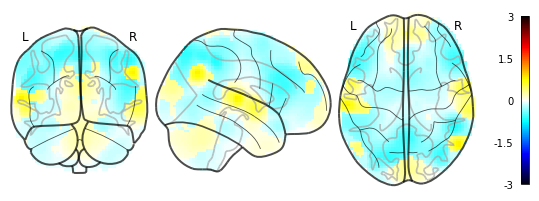

02/03/2020 13:48:23 Reconstruction Error (Frobenius Norm): 6.20629425e+01 out of 7.88558411e+02


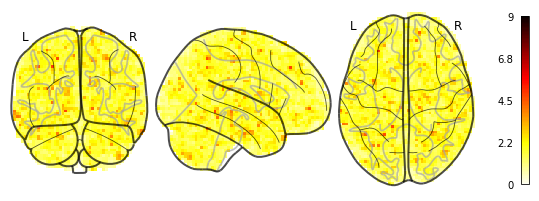

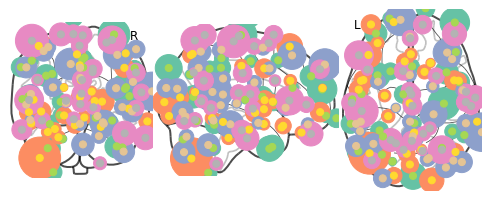

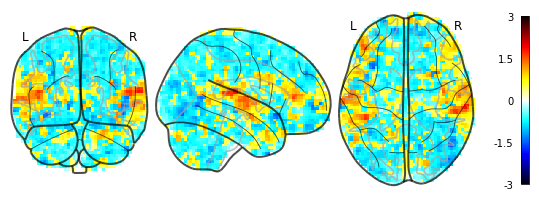

02/03/2020 13:48:27 Reconstruction Error (Frobenius Norm): 7.40748901e+01 out of 8.18825928e+02


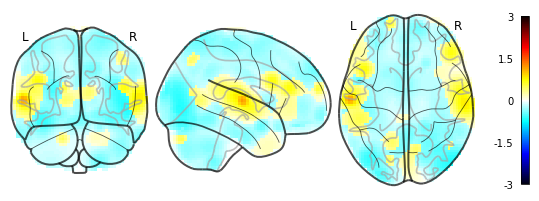

02/03/2020 13:48:29 Reconstruction Error (Frobenius Norm): 7.40748901e+01 out of 8.18825928e+02


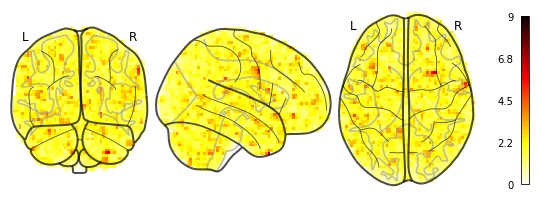

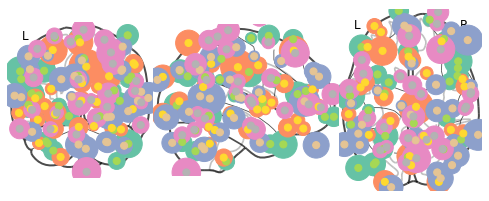

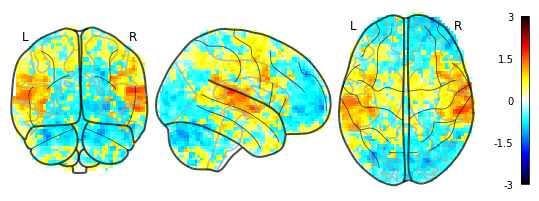

02/03/2020 13:48:33 Reconstruction Error (Frobenius Norm): 6.59980392e+01 out of 8.02983398e+02


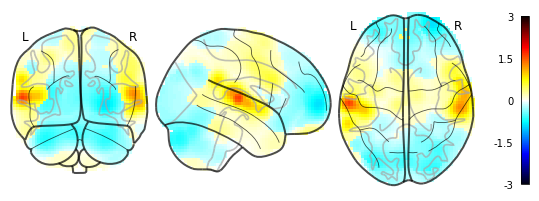

02/03/2020 13:48:34 Reconstruction Error (Frobenius Norm): 6.59980392e+01 out of 8.02983398e+02


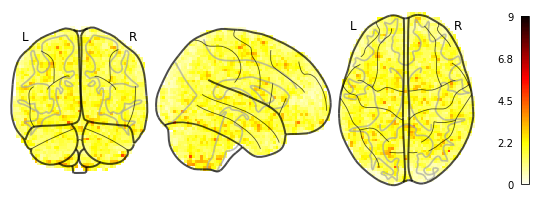

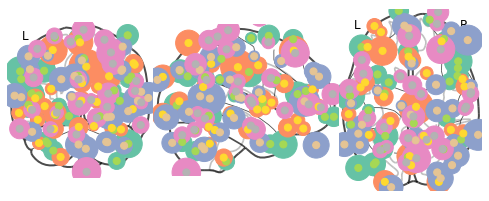

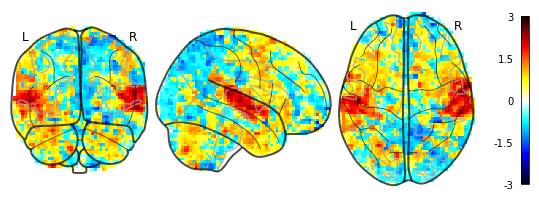

02/03/2020 13:48:38 Reconstruction Error (Frobenius Norm): 8.87796478e+01 out of 9.82731445e+02


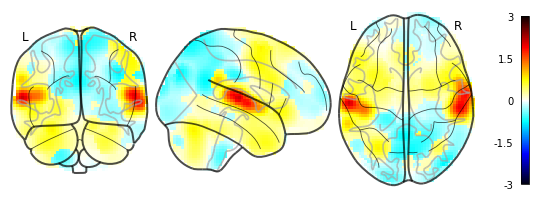

02/03/2020 13:48:39 Reconstruction Error (Frobenius Norm): 8.87796478e+01 out of 9.82731445e+02


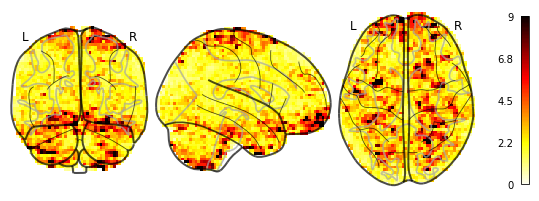

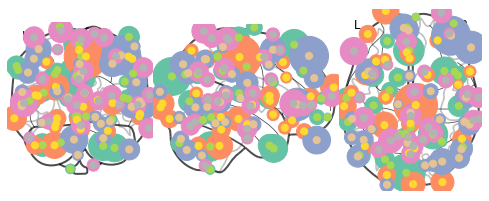

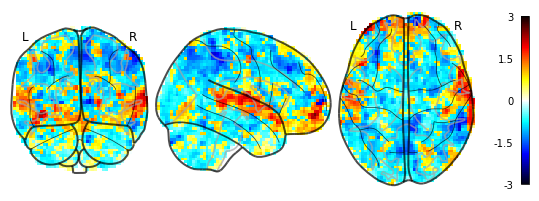

02/03/2020 13:48:43 Reconstruction Error (Frobenius Norm): 9.12415237e+01 out of 7.78388367e+02


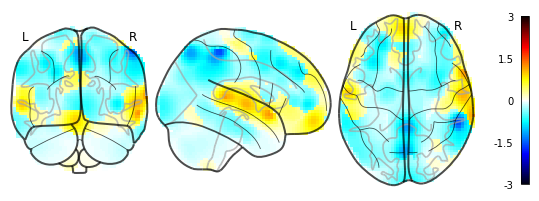

02/03/2020 13:48:45 Reconstruction Error (Frobenius Norm): 9.12415237e+01 out of 7.78388367e+02


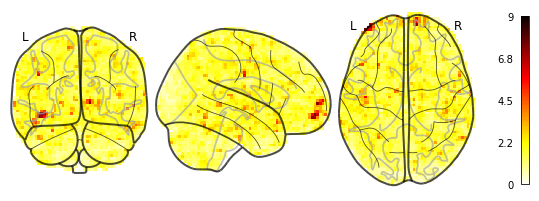

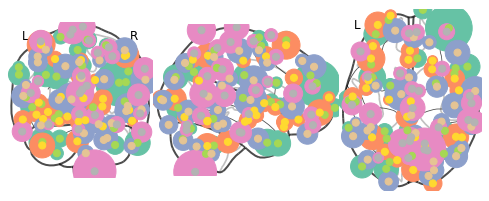

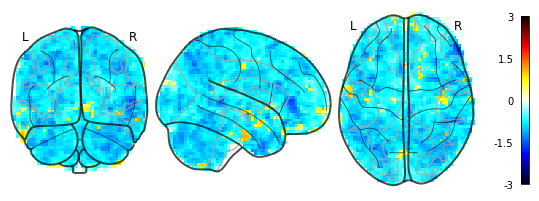

02/03/2020 13:48:49 Reconstruction Error (Frobenius Norm): 6.91372452e+01 out of 8.25541382e+02


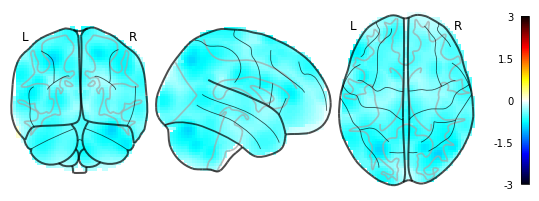

02/03/2020 13:48:50 Reconstruction Error (Frobenius Norm): 6.91372452e+01 out of 8.25541382e+02


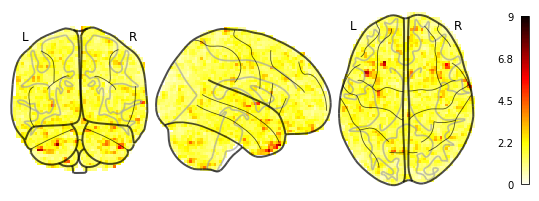

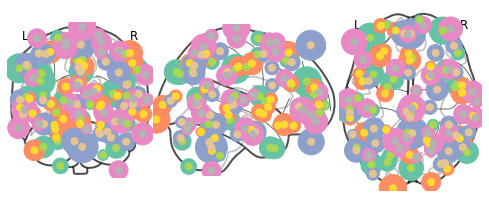

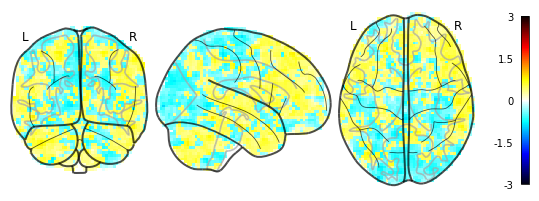

02/03/2020 13:48:54 Reconstruction Error (Frobenius Norm): 4.96006317e+01 out of 7.60057495e+02


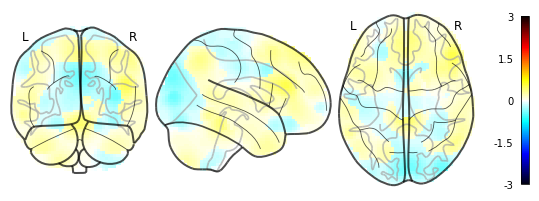

02/03/2020 13:48:55 Reconstruction Error (Frobenius Norm): 4.96006317e+01 out of 7.60057495e+02


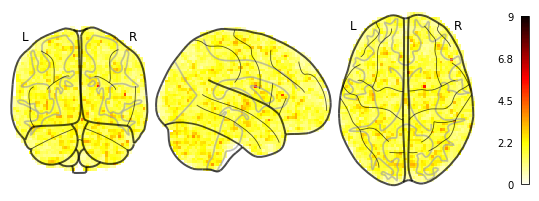

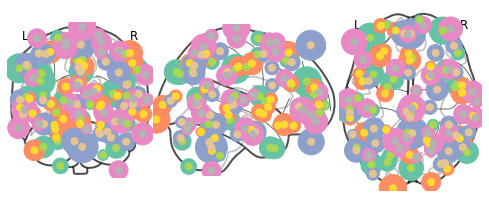

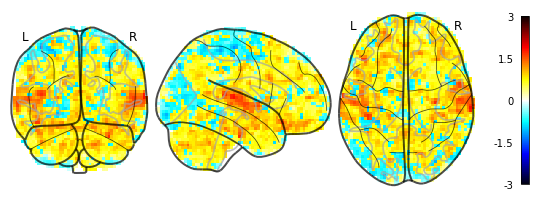

02/03/2020 13:48:59 Reconstruction Error (Frobenius Norm): 7.84962769e+01 out of 8.26601013e+02


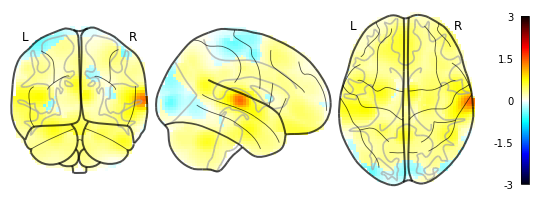

02/03/2020 13:49:01 Reconstruction Error (Frobenius Norm): 7.84962769e+01 out of 8.26601013e+02


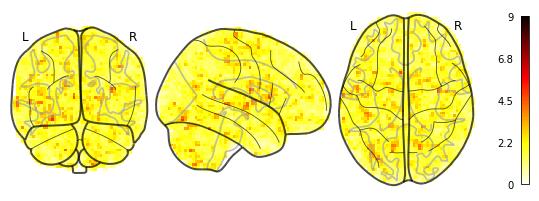

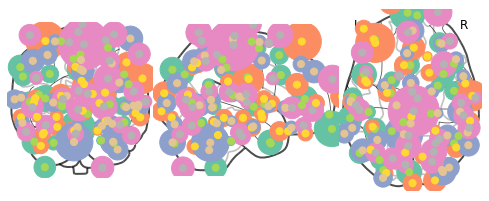

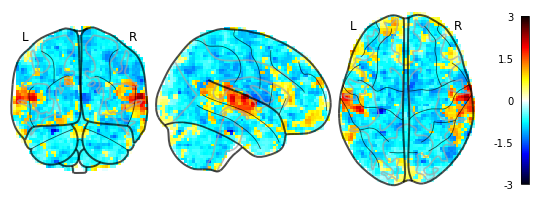

02/03/2020 13:49:05 Reconstruction Error (Frobenius Norm): 7.75268402e+01 out of 7.37839233e+02


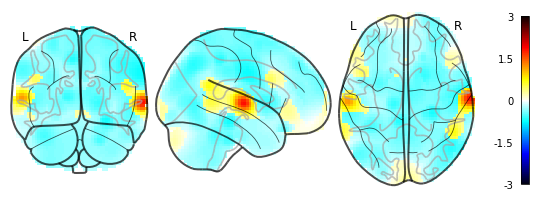

02/03/2020 13:49:06 Reconstruction Error (Frobenius Norm): 7.75268402e+01 out of 7.37839233e+02


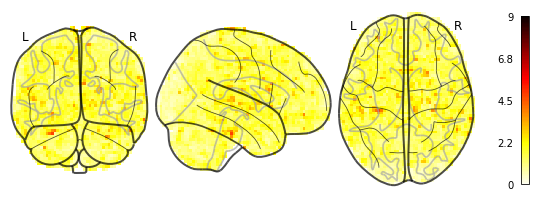

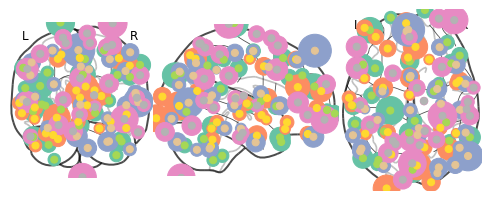

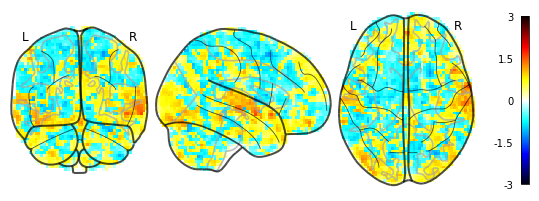

02/03/2020 13:49:10 Reconstruction Error (Frobenius Norm): 7.21223831e+01 out of 8.19254395e+02


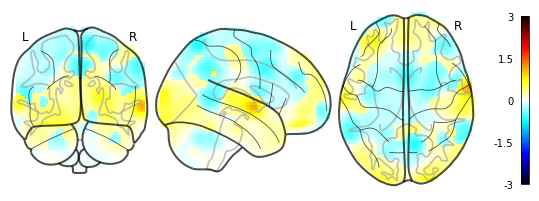

02/03/2020 13:49:11 Reconstruction Error (Frobenius Norm): 7.21223831e+01 out of 8.19254395e+02


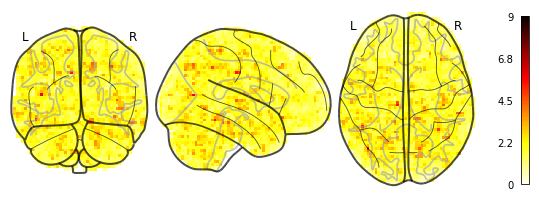

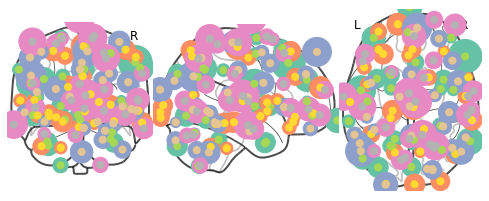

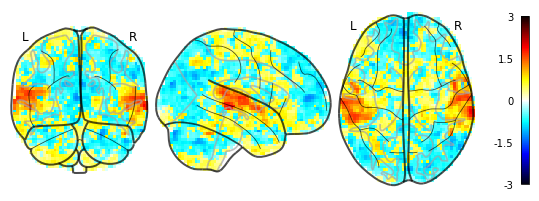

02/03/2020 13:49:15 Reconstruction Error (Frobenius Norm): 6.69865952e+01 out of 7.74554932e+02


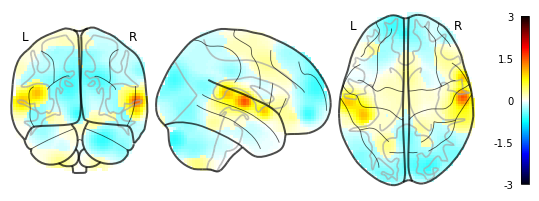

02/03/2020 13:49:17 Reconstruction Error (Frobenius Norm): 6.69865952e+01 out of 7.74554932e+02


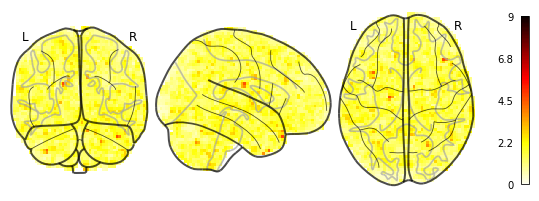

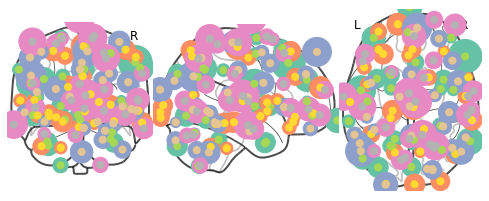

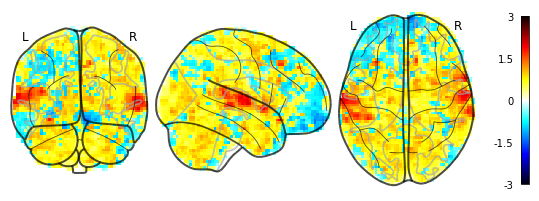

02/03/2020 13:49:21 Reconstruction Error (Frobenius Norm): 7.43345947e+01 out of 7.60746643e+02


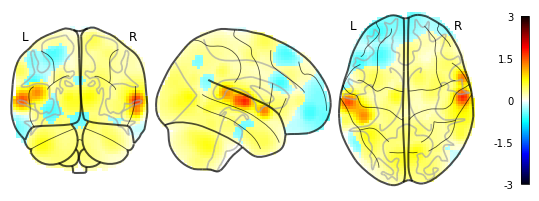

02/03/2020 13:49:22 Reconstruction Error (Frobenius Norm): 7.43345947e+01 out of 7.60746643e+02


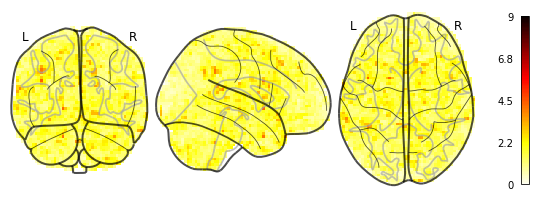

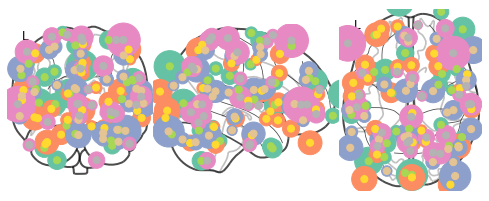

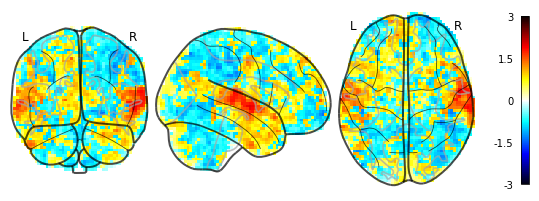

02/03/2020 13:49:26 Reconstruction Error (Frobenius Norm): 7.97287827e+01 out of 8.76528687e+02


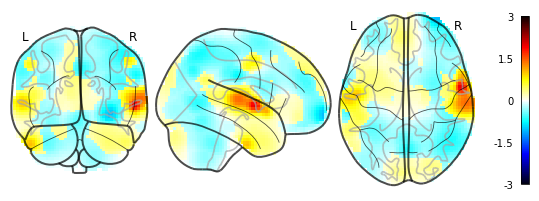

02/03/2020 13:49:28 Reconstruction Error (Frobenius Norm): 7.97287827e+01 out of 8.76528687e+02


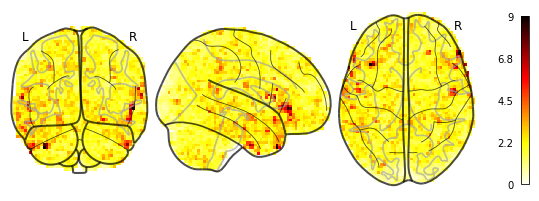

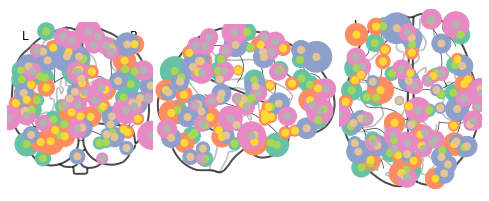

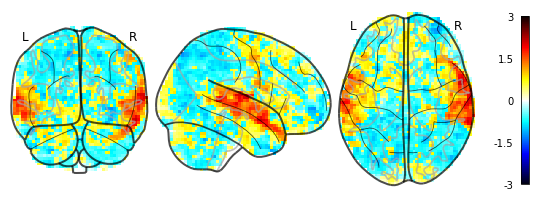

02/03/2020 13:49:32 Reconstruction Error (Frobenius Norm): 7.16579056e+01 out of 8.26226379e+02


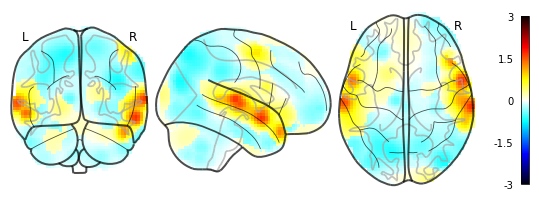

02/03/2020 13:49:33 Reconstruction Error (Frobenius Norm): 7.16579056e+01 out of 8.26226379e+02


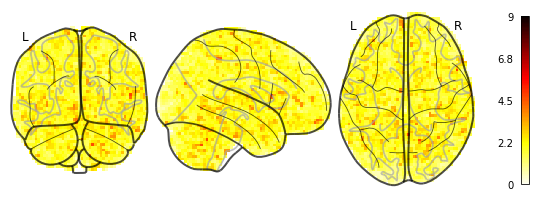

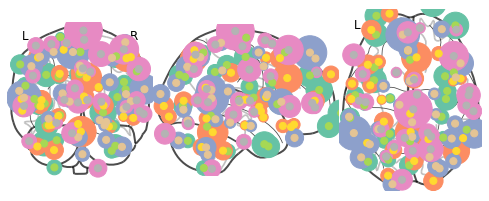

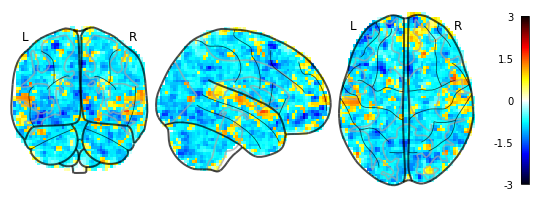

02/03/2020 13:49:37 Reconstruction Error (Frobenius Norm): 8.53582458e+01 out of 8.01213440e+02


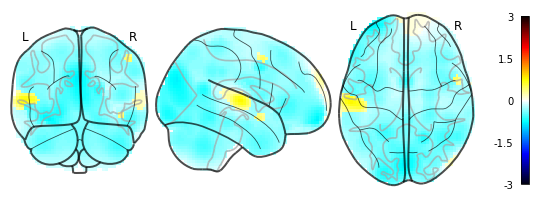

02/03/2020 13:49:39 Reconstruction Error (Frobenius Norm): 8.53582458e+01 out of 8.01213440e+02


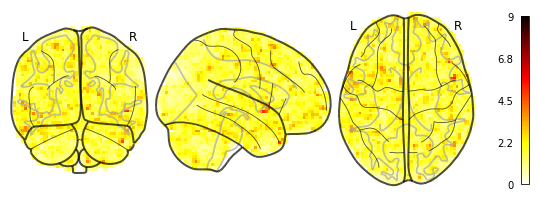

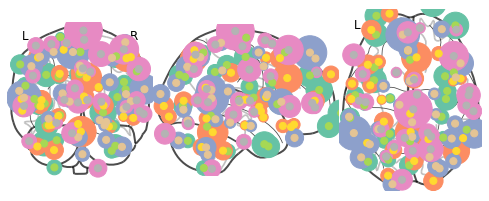

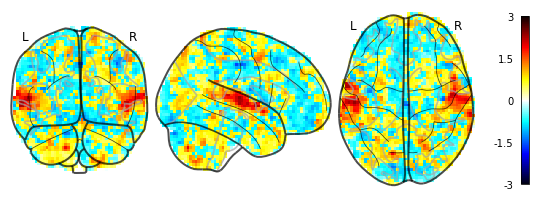

02/03/2020 13:49:42 Reconstruction Error (Frobenius Norm): 8.44230881e+01 out of 8.15328674e+02


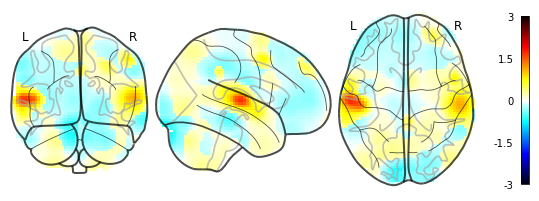

02/03/2020 13:49:44 Reconstruction Error (Frobenius Norm): 8.44230881e+01 out of 8.15328674e+02


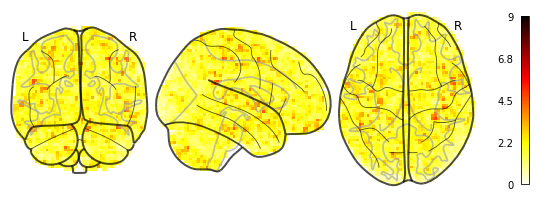

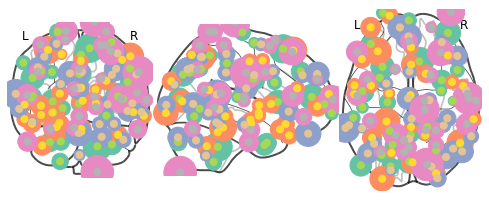

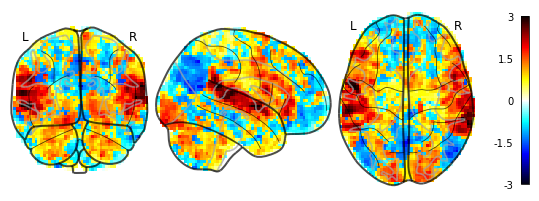

02/03/2020 13:49:48 Reconstruction Error (Frobenius Norm): 1.04408463e+02 out of 8.85320007e+02


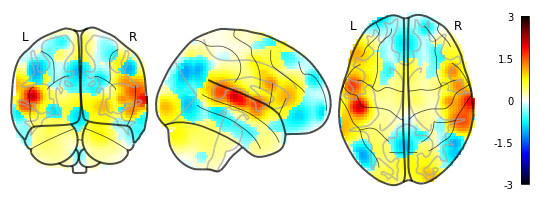

02/03/2020 13:49:49 Reconstruction Error (Frobenius Norm): 1.04408463e+02 out of 8.85320007e+02


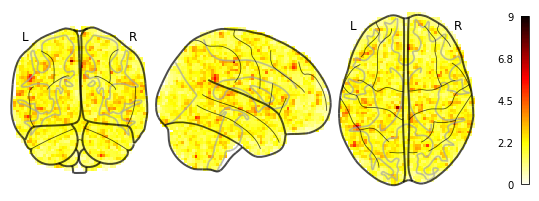

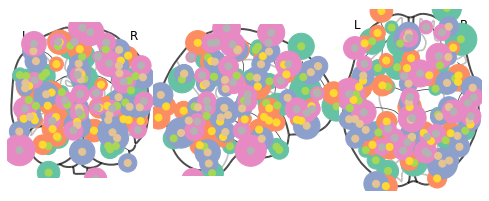

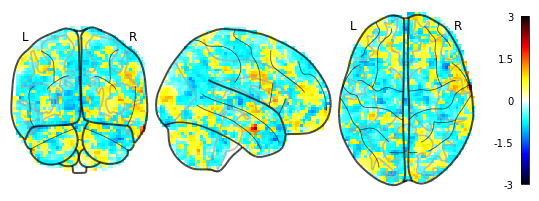

02/03/2020 13:49:53 Reconstruction Error (Frobenius Norm): 7.07832870e+01 out of 8.07556641e+02


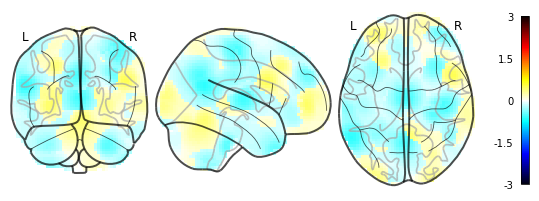

02/03/2020 13:49:54 Reconstruction Error (Frobenius Norm): 7.07832870e+01 out of 8.07556641e+02


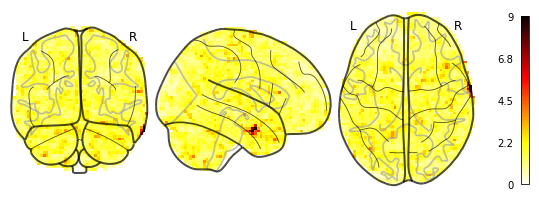

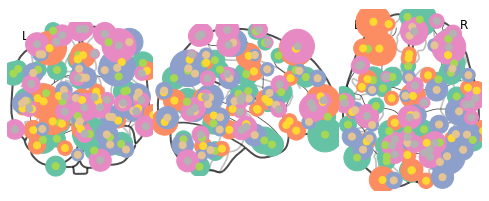

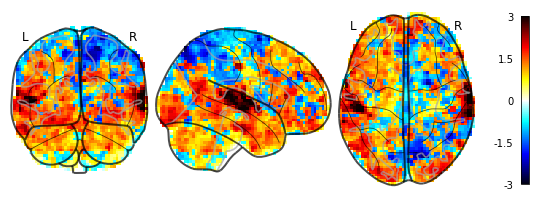

02/03/2020 13:49:58 Reconstruction Error (Frobenius Norm): 1.16790474e+02 out of 9.44142639e+02


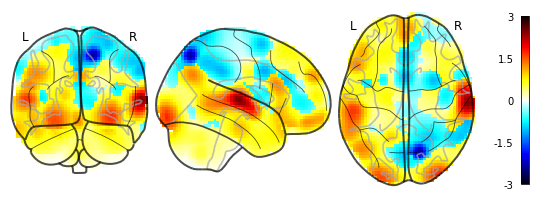

02/03/2020 13:50:00 Reconstruction Error (Frobenius Norm): 1.16790474e+02 out of 9.44142639e+02


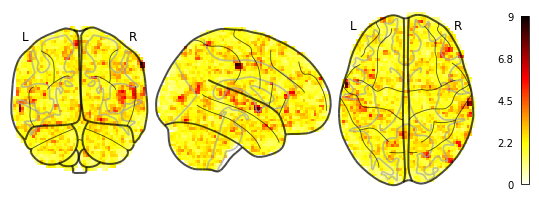

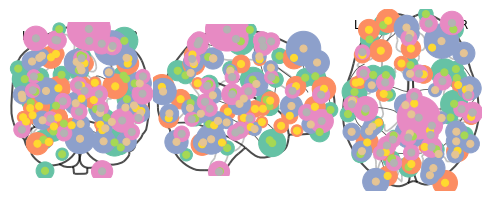

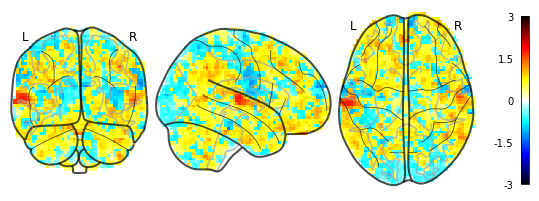

02/03/2020 13:50:04 Reconstruction Error (Frobenius Norm): 7.39209442e+01 out of 7.71454041e+02


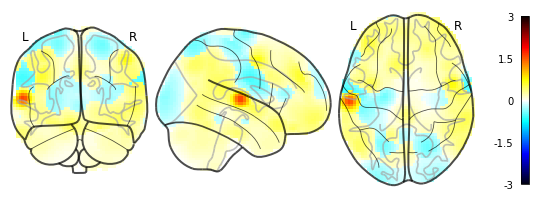

02/03/2020 13:50:06 Reconstruction Error (Frobenius Norm): 7.39209442e+01 out of 7.71454041e+02


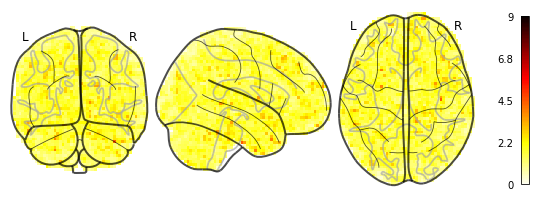

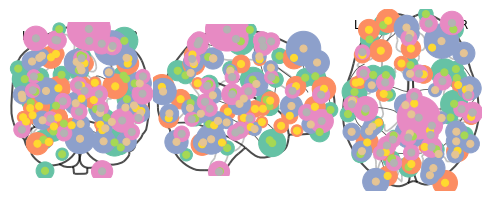

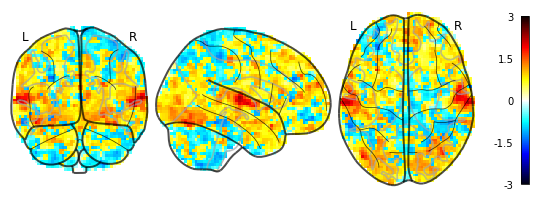

02/03/2020 13:50:10 Reconstruction Error (Frobenius Norm): 8.47498550e+01 out of 7.66293091e+02


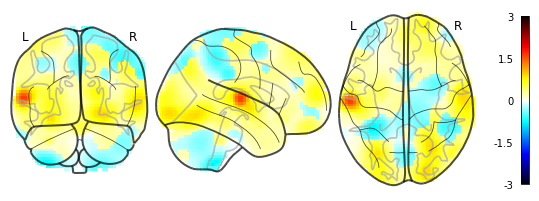

02/03/2020 13:50:11 Reconstruction Error (Frobenius Norm): 8.47498550e+01 out of 7.66293091e+02


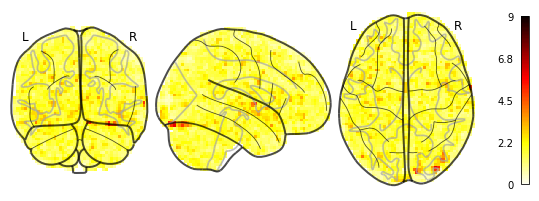

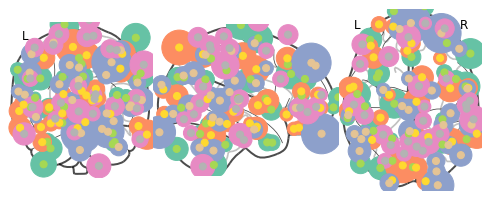

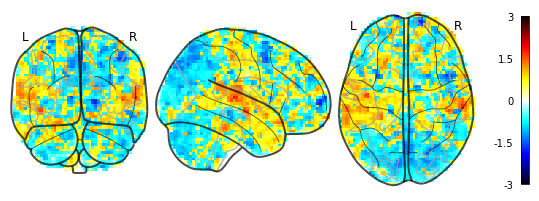

02/03/2020 13:50:15 Reconstruction Error (Frobenius Norm): 8.53799820e+01 out of 8.16404053e+02


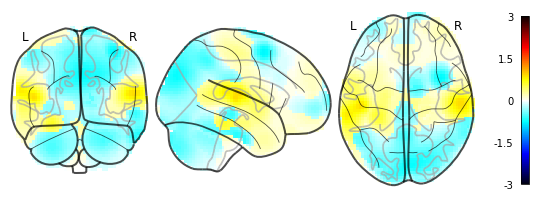

02/03/2020 13:50:17 Reconstruction Error (Frobenius Norm): 8.53799820e+01 out of 8.16404053e+02


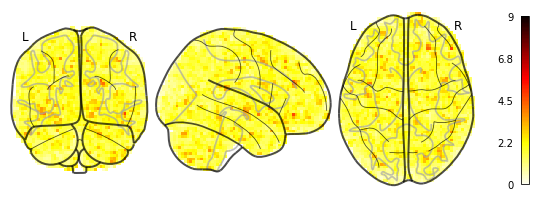

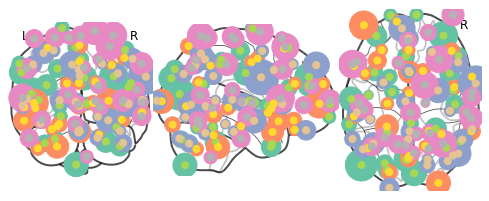

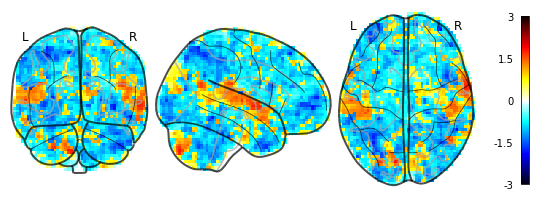

02/03/2020 13:50:21 Reconstruction Error (Frobenius Norm): 9.14078217e+01 out of 8.74308777e+02


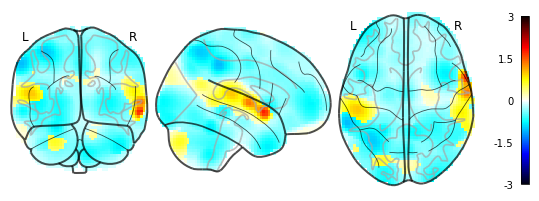

02/03/2020 13:50:22 Reconstruction Error (Frobenius Norm): 9.14078217e+01 out of 8.74308777e+02


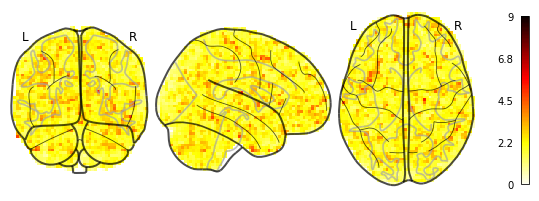

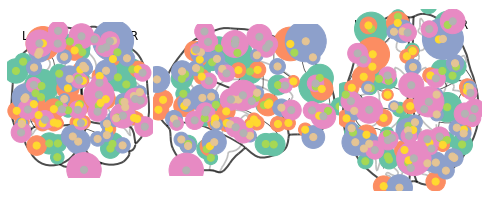

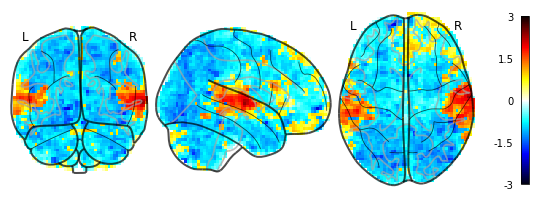

02/03/2020 13:50:26 Reconstruction Error (Frobenius Norm): 8.16972961e+01 out of 7.69490845e+02


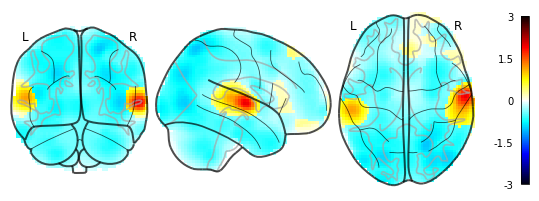

02/03/2020 13:50:28 Reconstruction Error (Frobenius Norm): 8.16972961e+01 out of 7.69490845e+02


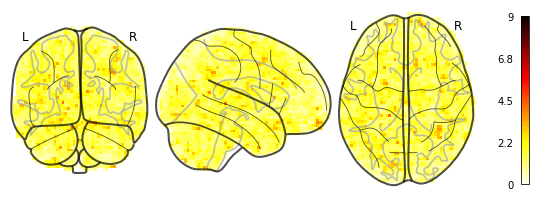

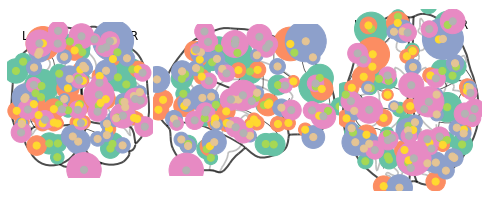

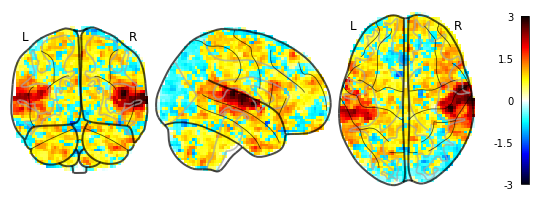

02/03/2020 13:50:31 Reconstruction Error (Frobenius Norm): 8.50618973e+01 out of 8.00959412e+02


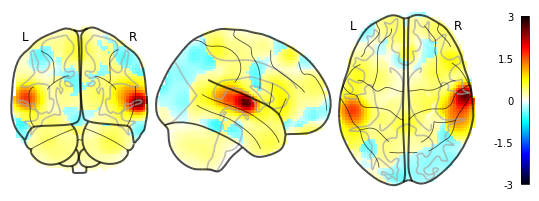

02/03/2020 13:50:33 Reconstruction Error (Frobenius Norm): 8.50618973e+01 out of 8.00959412e+02


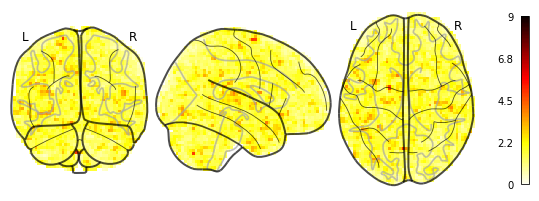

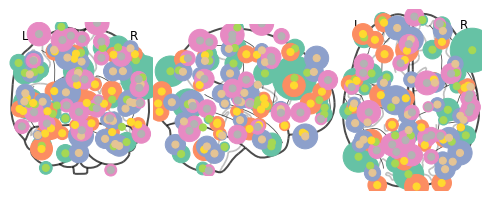

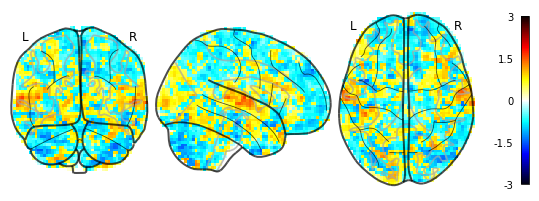

02/03/2020 13:50:37 Reconstruction Error (Frobenius Norm): 8.18856735e+01 out of 8.11815735e+02


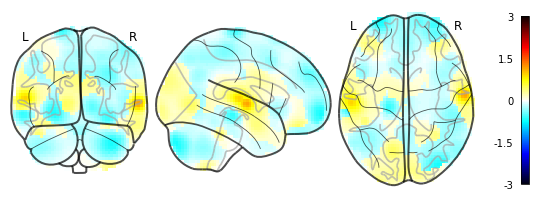

02/03/2020 13:50:39 Reconstruction Error (Frobenius Norm): 8.18856735e+01 out of 8.11815735e+02


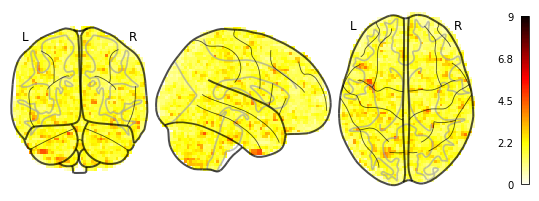

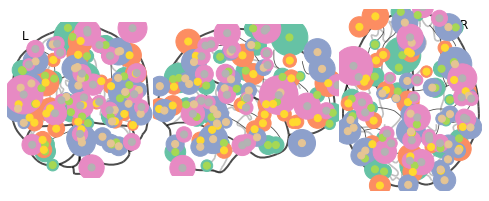

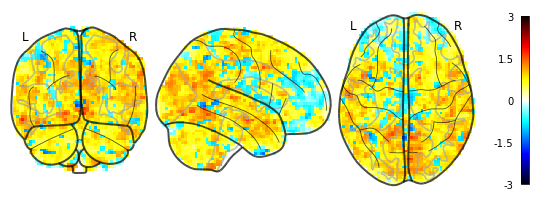

02/03/2020 13:50:42 Reconstruction Error (Frobenius Norm): 7.84386597e+01 out of 8.25840393e+02


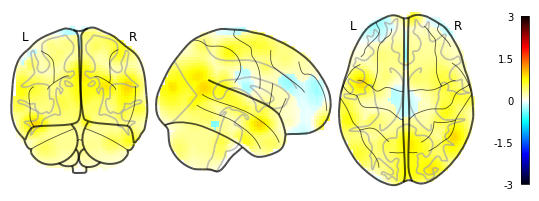

02/03/2020 13:50:44 Reconstruction Error (Frobenius Norm): 7.84386597e+01 out of 8.25840393e+02


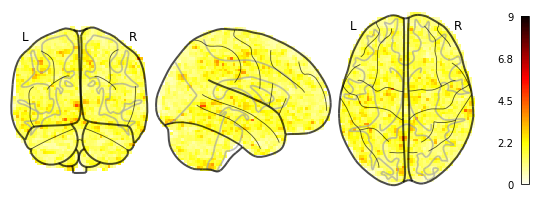

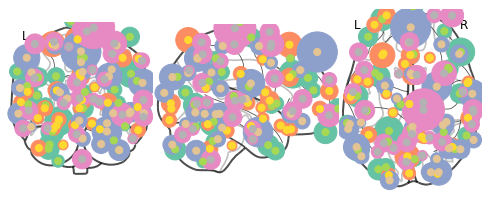

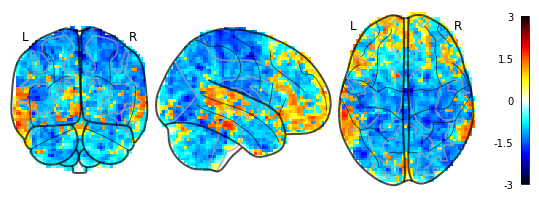

02/03/2020 13:50:48 Reconstruction Error (Frobenius Norm): 9.84801636e+01 out of 8.54286011e+02


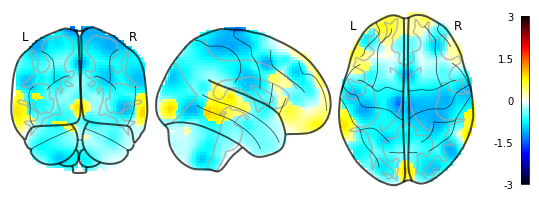

02/03/2020 13:50:49 Reconstruction Error (Frobenius Norm): 9.84801636e+01 out of 8.54286011e+02


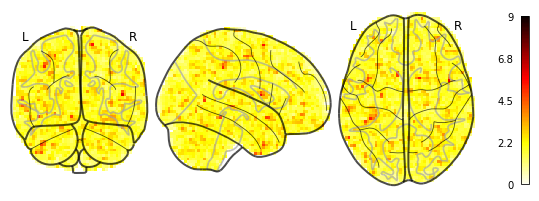

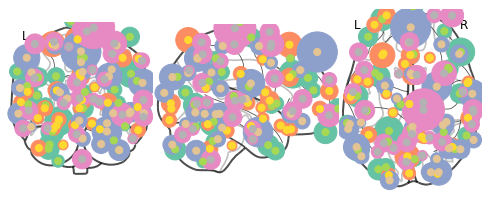

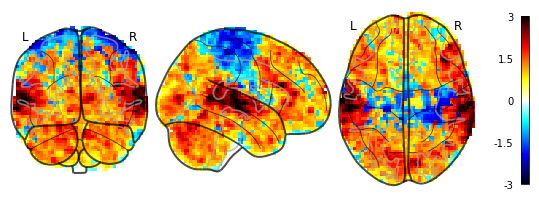

02/03/2020 13:50:53 Reconstruction Error (Frobenius Norm): 1.11965050e+02 out of 9.37374207e+02


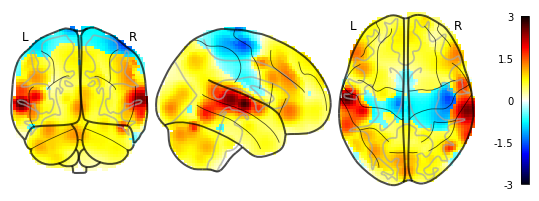

02/03/2020 13:50:55 Reconstruction Error (Frobenius Norm): 1.11965050e+02 out of 9.37374207e+02


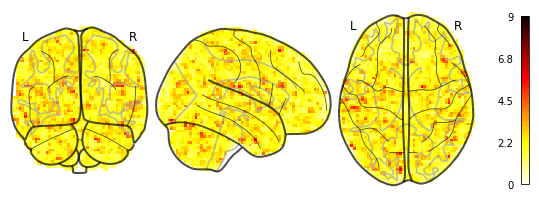

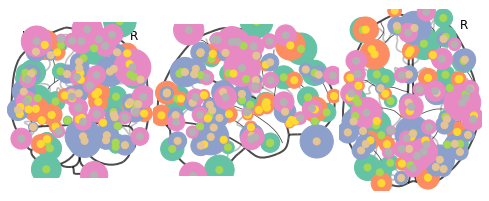

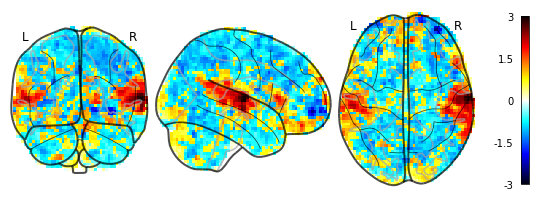

02/03/2020 13:50:59 Reconstruction Error (Frobenius Norm): 9.46197128e+01 out of 8.00525208e+02


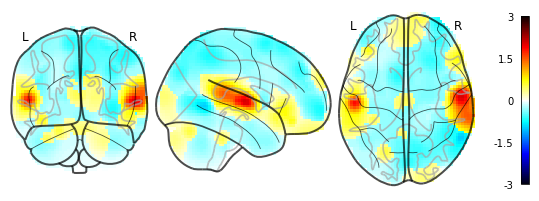

02/03/2020 13:51:00 Reconstruction Error (Frobenius Norm): 9.46197128e+01 out of 8.00525208e+02


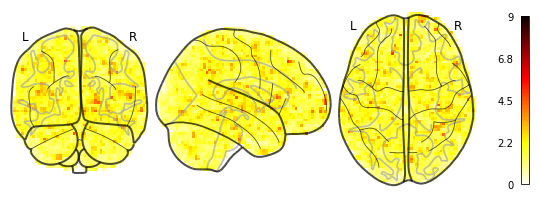

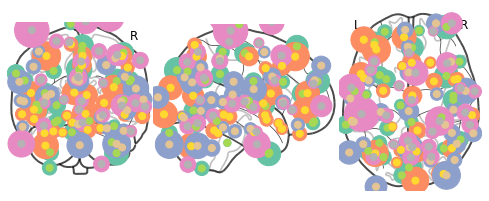

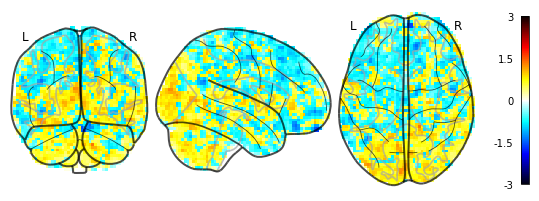

02/03/2020 13:51:04 Reconstruction Error (Frobenius Norm): 7.49116364e+01 out of 8.57255310e+02


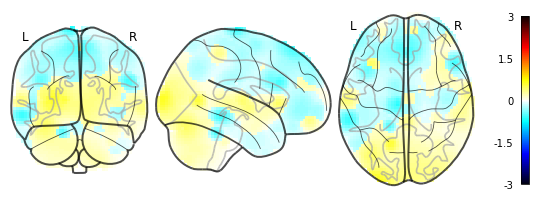

02/03/2020 13:51:05 Reconstruction Error (Frobenius Norm): 7.49116364e+01 out of 8.57255310e+02


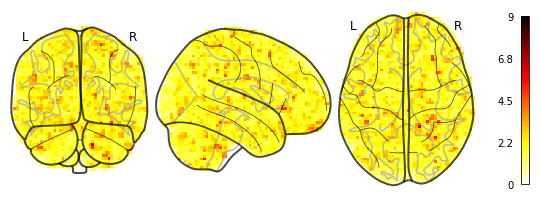

In [14]:
for index in validation_blocks[0:-1:3]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


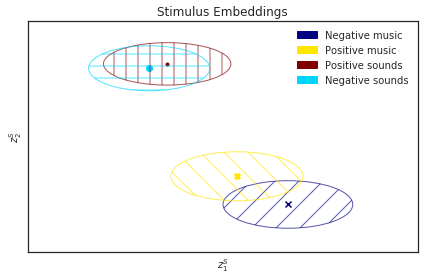

In [15]:
dtfa.scatter_task_embedding(labeler=task_labeler, colormap='jet', figsize=None,
                            filename='lepping_2017_noresponse-task_embedding.pdf',
                            legend_ordering=[0, 2, 3, 1])

In [16]:
dtfa.average_reconstruction_error()

02/03/2020 13:51:40 Average reconstruction error (MSE): 8.92310890e-01
02/03/2020 13:51:40 Average data norm (Euclidean): 1.05002988e+00
02/03/2020 13:51:40 Percent average reconstruction error: 0.343150


(0.8923108904949973, 1.0500298773474526, 0.003431498319939276)

In [17]:
dtfa.average_reconstruction_error(weighted=False)

02/03/2020 13:52:11 Average reconstruction error (MSE): 7.05145003e+02 +/- 4.75648424e+01
02/03/2020 13:52:11 Average data norm (Euclidean): 8.29830948e+02 +/- 5.52383552e+01
02/03/2020 13:52:11 Percent average reconstruction error: 85.097411 +/- 4.71859709e+00


(array([740.41564941, 715.13702393, 652.51483154, 732.80157471,
        682.76599121, 696.10809326, 728.07452393, 708.99200439,
        632.1071167 , 628.03161621, 642.77758789, 633.02307129,
        671.19537354, 724.0022583 , 692.5723877 , 680.10754395,
        661.06085205, 687.91845703, 673.2598877 , 687.47357178,
        736.61810303, 745.62762451, 752.23461914, 747.18743896,
        707.23522949, 721.44213867, 715.84039307, 702.24700928,
        683.06756592, 756.93566895, 712.67602539, 735.13977051,
        680.05059814, 692.30780029, 687.05615234, 680.32940674,
        639.56854248, 638.05291748, 644.39813232, 605.07110596,
        717.41772461, 659.04333496, 707.22943115, 721.32989502,
        702.79577637, 717.4050293 , 711.26959229, 740.55688477,
        735.18572998, 729.33111572, 733.50610352, 712.04724121,
        750.96136475, 758.98638916, 766.93341064, 778.20196533,
        749.7243042 , 757.86688232, 759.04968262, 736.98651123,
        712.30010986, 745.55767822, 688.

In [18]:
def condition_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


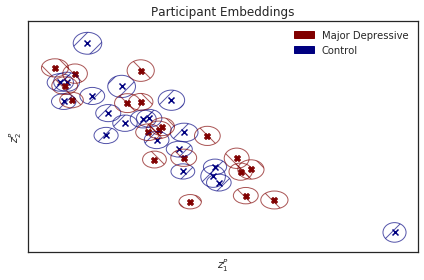

In [19]:
dtfa.scatter_subject_embedding(labeler=condition_labeler, colormap='jet', figsize=None,
                               filename='lepping_2017_noresponse-subject_embedding.pdf')

In [20]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[438908896.0, -437158304.0, 1750619.25],
 [438930080.0, -437141184.0, 1752415.875]]

In [21]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[85528456.0, -85212096.0, 316365.125], [85538040.0, -85200840.0, 317106.125]]